### Setup Environment:

In [1]:
from src.get_dataset import get_dataset, split_data
from src.data_loader import BRSETDataset, process_labels
from src.RetFound import get_retfound
from src.FocalLoss import FocalLoss
from src.model import FoundationalCVModel, FoundationalCVModelWithClassifier
from sklearn.utils.class_weight import compute_class_weight

import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader

from src.train import train
from src.test import test

In [2]:
# Constants:
DATASET = '/home/opc/Retina/BRSET/'
LABELS_PATH = os.path.join(DATASET, 'labels.csv')
IMAGES = os.path.join(DATASET, 'images/')
DOWNLOAD = False
SHAPE = (224, 224)
LABEL = 'DR_ICDR'
IMAGE_COL = 'image_id'
TEST_SIZE = 0.3
UNDERSAMPLE = False

"""
Dataset Mean and Std:
NORM_MEAN = [0.5896205017400412, 0.29888971649817453, 0.1107679405196557]
NORM_STD = [0.28544273712830986, 0.15905456049750208, 0.07012281660980953]

ImageNet Mean and Std:
NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD = [0.229, 0.224, 0.225]
"""

NORM_MEAN = None # [0.485, 0.456, 0.406]
NORM_STD = None # [0.229, 0.224, 0.225]

BACKBONE = 'convnextv2_base'
MODE = 'fine_tune'
backbone_mode= 'fine_tune' # 'fine_tune'

HIDDEN = [128]
num_classes = 3

BATCH_SIZE = 16
NUM_WORKERS = 4

LOSS = None #'focal_loss'
OPTIMIZER = 'adam'

# Define your hyperparameters
num_epochs = 50
learning_rate = 1e-5

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


#### Read csv file:

In [3]:
df = get_dataset(DATASET, download=DOWNLOAD, info=False)
df.head()

loading csv file in /home/opc/Retina/BRSET//labels.csv


,image_id,patient_id,camera,patient_age,comorbidities,diabetes_time_y,insuline,patient_sex,exam_eye,diabetes,...,vascular_occlusion,hypertensive_retinopathy,drusens,hemorrhage,retinal_detachment,myopic_fundus,increased_cup_disc,other,quality,normality
0,img00001,1,Canon CR,48.0,diabetes1,12,yes,1,1,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
1,img00002,1,Canon CR,48.0,diabetes1,12,yes,1,2,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
2,img00003,2,Canon CR,18.0,diabetes1,7,yes,2,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
3,img00004,2,Canon CR,18.0,diabetes1,7,yes,2,2,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
4,img00005,3,Canon CR,22.0,diabetes1,11,yes,1,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal


In [4]:
# Convert into 3 classes:

# Normal = 0; Non-proliferative = 1, 2, 3; Proliferative = 4
# Map values to categories
df[LABEL] = df[LABEL].apply(lambda x: 'Normal' if x == 0 else ('Non-proliferative' if x in [1, 2, 3] else 'Proliferative'))

Train data shape: (11386, 35)
Test data shape: (4880, 35)


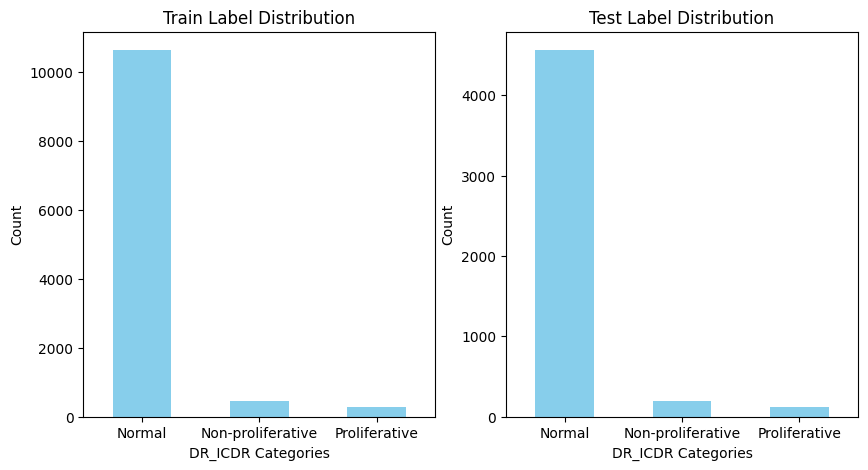

Getting validation set...
Train data shape: (10247, 35)
Test data shape: (1139, 35)


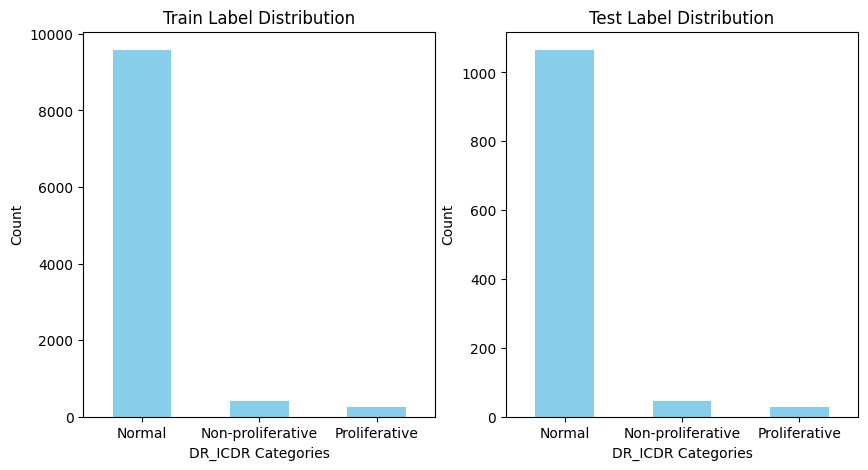

In [5]:
# Split dataset into train, test and validation:
df_train, df_test = split_data(df, LABEL, TEST_SIZE, undersample=False)
print('Getting validation set...')
df_train, df_val = split_data(df_train, LABEL, 0.10)

### Dataloaders

In [6]:
# Train the one hot encoder on the train set and get the labels for the test and validation sets:
train_labels, mlb, train_columns = process_labels(df_train, col=LABEL)

In [7]:
# Define the target image shape

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(SHAPE),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(50),  # Randomly rotate the image by up to 10 degrees
])

if NORM_MEAN is not None and NORM_STD is not None:
    train_transforms.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

test_transform = transforms.Compose([
    transforms.Resize(SHAPE),
    transforms.ToTensor(),
])

if NORM_MEAN is not None and NORM_STD is not None:
    test_transform.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

In [8]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

In [9]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

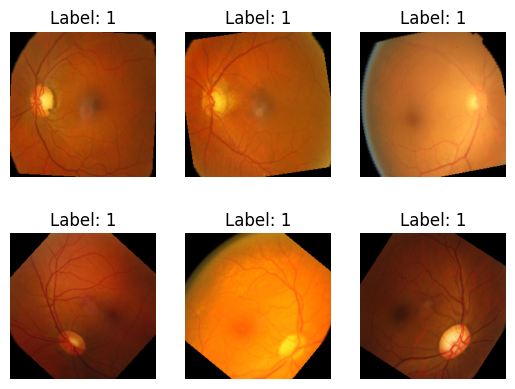

In [10]:
# Print 6 samples with their labels
# Iterate through the DataLoader and plot the images with labels

for batch in train_dataloader:

    images, labels = batch['image'], batch['labels']

    for i in range(len(images)):
        if i == 6:
            break
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i].permute(1, 2, 0))  # Permute to (H, W, C) from (C, H, W)
        plt.title(f"Label: {np.argmax(labels[i])}")
        plt.axis('off')
    plt.show()
    break

### Model

In [11]:
# Create a DataLoader to generate embeddings
#model = get_retfound(weights='/home/opc/FoundationalRetina/Weights/RETFound_cfp_weights.pth', num_classes=3)
# Create a DataLoader to generate embeddings
backbone_model = FoundationalCVModel(backbone=BACKBONE, mode=MODE)
model = FoundationalCVModelWithClassifier(backbone_model, hidden=HIDDEN, num_classes=num_classes, mode=MODE, backbone_mode=backbone_mode)
model.to(device)

# Use DataParallel to parallelize the model across multiple GPUs
if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model, [0,1])

Using 2 GPUs!


### Training:

In [12]:
if LOSS == 'focal_loss':
    class_distribution = train_dataloader.dataset.labels.sum(axis=0)
    print(f'Class distribution: {class_distribution}')
    class_dis = np.array(class_distribution)
    class_weights =1-class_dis/np.sum(class_dis)
    weights = torch.tensor(class_weights).to(device)
    #criterion = FocalLoss()  # Focal Loss
    criterion = FocalLoss(gamma=2, alpha=weights)
else:
    # Assuming train_loader.dataset.labels is a one-hot representation
    class_indices = np.argmax(train_dataloader.dataset.labels, axis=1)

    # Compute class weights using class indices
    class_weights = compute_class_weight('balanced', classes=np.unique(class_indices), y=class_indices)
    class_weights = torch.tensor(class_weights, dtype=torch.float32)
    criterion = nn.CrossEntropyLoss(weight=class_weights).to(device)
    #criterion = nn.BCEWithLogitsLoss() # Binary Cross-Entropy Loss

if OPTIMIZER == 'adam':
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
elif OPTIMIZER == 'adamw':
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
else:
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

In [13]:
model = train(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=num_epochs, save=True, device=device, backbone=f'convnextv2_3class_{LABEL}')

100%|██████████| 72/72 [00:20<00:00,  3.43it/s]


Epoch 1, Train Loss: 1.068221029690387, Val Loss: 1.1024669541252985, F1 Score: 0.2054390601376539


100%|██████████| 72/72 [00:21<00:00,  3.42it/s]


Epoch 2, Train Loss: 0.9736394026722067, Val Loss: 0.9311223373644881, F1 Score: 0.332744555993384


100%|██████████| 72/72 [00:20<00:00,  3.47it/s]


Epoch 3, Train Loss: 0.9059813466858753, Val Loss: 1.050071665810214, F1 Score: 0.21190035523997727


100%|██████████| 72/72 [00:20<00:00,  3.44it/s]


Epoch 4, Train Loss: 0.8397801034210625, Val Loss: 0.8109244933972756, F1 Score: 0.5408563069917202


100%|██████████| 72/72 [00:21<00:00,  3.43it/s]


Epoch 5, Train Loss: 0.8129763450014423, Val Loss: 0.9661308602533407, F1 Score: 0.37048446671877633


100%|██████████| 72/72 [00:20<00:00,  3.50it/s]


Epoch 6, Train Loss: 0.7801176424424473, Val Loss: 0.785596371938785, F1 Score: 0.5932180396511831


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 7, Train Loss: 0.7534417149708164, Val Loss: 0.8780930954962969, F1 Score: 0.46321101235029644


100%|██████████| 72/72 [00:20<00:00,  3.47it/s]


Epoch 8, Train Loss: 0.7506138791043934, Val Loss: 0.9442632651577393, F1 Score: 0.3891522437990574


100%|██████████| 72/72 [00:20<00:00,  3.44it/s]


Epoch 9, Train Loss: 0.7116305062927991, Val Loss: 0.8995331333329281, F1 Score: 0.43385127705303145


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 10, Train Loss: 0.6847898667785753, Val Loss: 0.7709659925765462, F1 Score: 0.5679278080797394


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 11, Train Loss: 0.6451491549518105, Val Loss: 0.8283490707269974, F1 Score: 0.6301138243857928


100%|██████████| 72/72 [00:20<00:00,  3.47it/s]


Epoch 12, Train Loss: 0.6489710834417812, Val Loss: 0.8165689882718854, F1 Score: 0.4812153377752881


100%|██████████| 72/72 [00:21<00:00,  3.43it/s]


Epoch 13, Train Loss: 0.6085916753980374, Val Loss: 0.9576615086860127, F1 Score: 0.5357083943990814


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 14, Train Loss: 0.6007027137856029, Val Loss: 1.9731000356583133, F1 Score: 0.5103524603594162


100%|██████████| 72/72 [00:20<00:00,  3.45it/s]


Epoch 15, Train Loss: 0.5846240822045646, Val Loss: 0.9615468037211232, F1 Score: 0.6696816945480385


100%|██████████| 72/72 [00:20<00:00,  3.49it/s]


Epoch 16, Train Loss: 0.5612104921231218, Val Loss: 0.7042280740311576, F1 Score: 0.7105763577985801


100%|██████████| 72/72 [00:20<00:00,  3.43it/s]


Epoch 17, Train Loss: 0.519664246060082, Val Loss: 0.7629438948093189, F1 Score: 0.6478241284066527


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 18, Train Loss: 0.5369367600184707, Val Loss: 0.6900305881475409, F1 Score: 0.706145706145706


100%|██████████| 72/72 [00:20<00:00,  3.51it/s]


Epoch 19, Train Loss: 0.4979264632030136, Val Loss: 0.6514156628400087, F1 Score: 0.6737864971907527


100%|██████████| 72/72 [00:20<00:00,  3.47it/s]


Epoch 20, Train Loss: 0.4440340269909076, Val Loss: 0.8286302394958006, F1 Score: 0.6797917499061664


100%|██████████| 72/72 [00:20<00:00,  3.44it/s]


Epoch 21, Train Loss: 0.43443417009808905, Val Loss: 0.556311075316949, F1 Score: 0.7176196890535804


100%|██████████| 72/72 [00:21<00:00,  3.42it/s]


Epoch 22, Train Loss: 0.43341260468485576, Val Loss: 0.9242900505972406, F1 Score: 0.7350057515051017


100%|██████████| 72/72 [00:21<00:00,  3.42it/s]


Epoch 23, Train Loss: 0.45158990423737005, Val Loss: 0.8253559538991087, F1 Score: 0.6546124884659164


100%|██████████| 72/72 [00:21<00:00,  3.43it/s]


Epoch 24, Train Loss: 0.38939393836534153, Val Loss: 0.537319359007395, F1 Score: 0.7309058402290773


100%|██████████| 72/72 [00:20<00:00,  3.50it/s]


Epoch 25, Train Loss: 0.37141093354259563, Val Loss: 0.6078236686169274, F1 Score: 0.7297721369855679


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 26, Train Loss: 0.35592620580656203, Val Loss: 0.6269547171218114, F1 Score: 0.7340802490901955


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 27, Train Loss: 0.3161610672715325, Val Loss: 0.45281201807989013, F1 Score: 0.7637315960939871


100%|██████████| 72/72 [00:20<00:00,  3.45it/s]


Epoch 28, Train Loss: 0.2933687320917659, Val Loss: 0.6023899365423454, F1 Score: 0.7806695275436594


100%|██████████| 72/72 [00:20<00:00,  3.45it/s]


Epoch 29, Train Loss: 0.35170729507150217, Val Loss: 0.5367541911804842, F1 Score: 0.7323277087211514


100%|██████████| 72/72 [00:20<00:00,  3.47it/s]


Epoch 30, Train Loss: 0.26951951011085473, Val Loss: 0.5254627282524275, F1 Score: 0.7710541824300137


100%|██████████| 72/72 [00:21<00:00,  3.39it/s]


Epoch 31, Train Loss: 0.2438056571743278, Val Loss: 0.5404572219898304, F1 Score: 0.7993639622311594


100%|██████████| 72/72 [00:20<00:00,  3.55it/s]


Epoch 32, Train Loss: 0.24870095879432286, Val Loss: 0.5522928598543836, F1 Score: 0.7357420156593069


100%|██████████| 72/72 [00:21<00:00,  3.40it/s]


Epoch 33, Train Loss: 0.2344714188759394, Val Loss: 0.6437215581794994, F1 Score: 0.7600457665903889


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 34, Train Loss: 0.22020542697745626, Val Loss: 0.5861376210943692, F1 Score: 0.7508332548081905


100%|██████████| 72/72 [00:20<00:00,  3.44it/s]


Epoch 35, Train Loss: 0.21116938046216036, Val Loss: 0.5321128531359136, F1 Score: 0.7639244766634342


100%|██████████| 72/72 [00:21<00:00,  3.39it/s]


Epoch 36, Train Loss: 0.24405098300828204, Val Loss: 0.674093443641646, F1 Score: 0.735671571591749


100%|██████████| 72/72 [00:20<00:00,  3.50it/s]


Epoch 37, Train Loss: 0.20283340387825102, Val Loss: 0.5542320752412908, F1 Score: 0.793271700051361


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 38, Train Loss: 0.19275462455966172, Val Loss: 0.41247288008323973, F1 Score: 0.7960011219297192
Early stopping triggered.


### Test

100%|██████████| 305/305 [01:23<00:00,  3.64it/s]


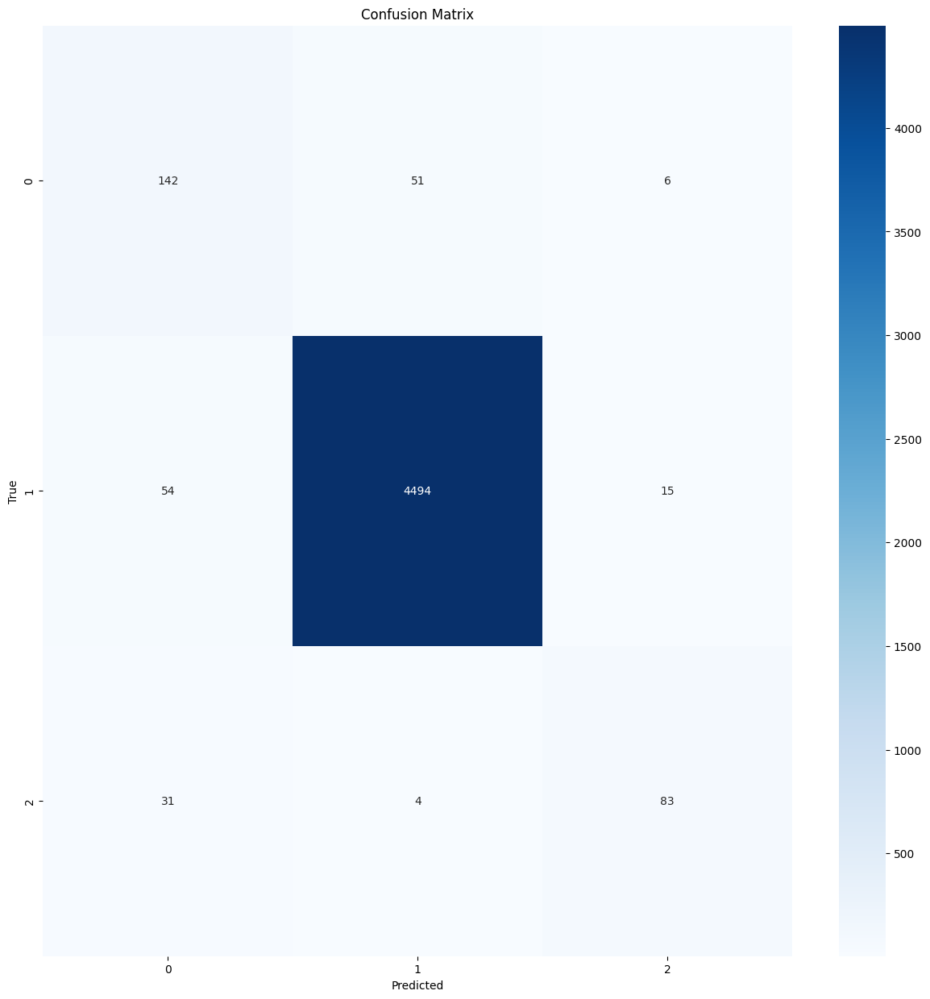

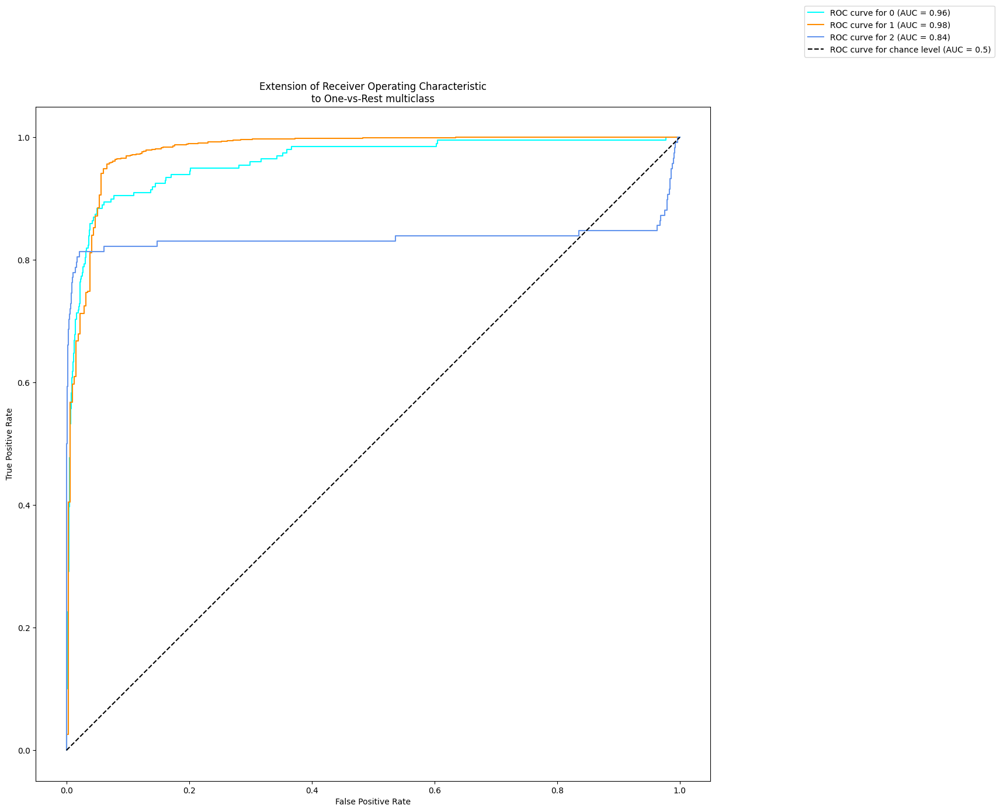

              precision    recall  f1-score   support

           0       0.63      0.71      0.67       199
           1       0.99      0.98      0.99      4563
           2       0.80      0.70      0.75       118

    accuracy                           0.97      4880
   macro avg       0.80      0.80      0.80      4880
weighted avg       0.97      0.97      0.97      4880

##################################################  Saliency Maps  ##################################################

Class 0:


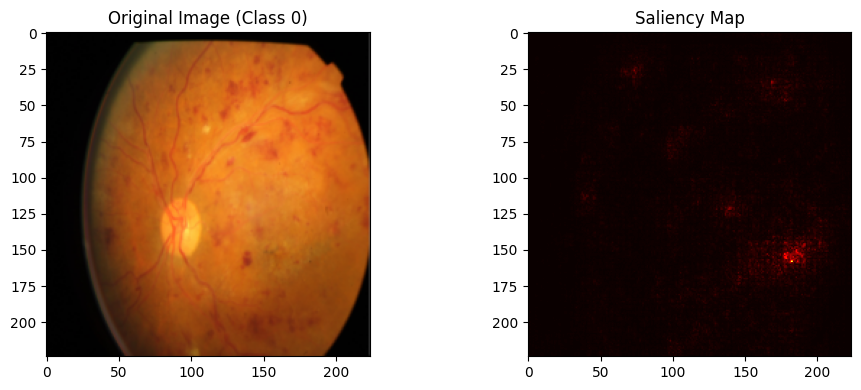

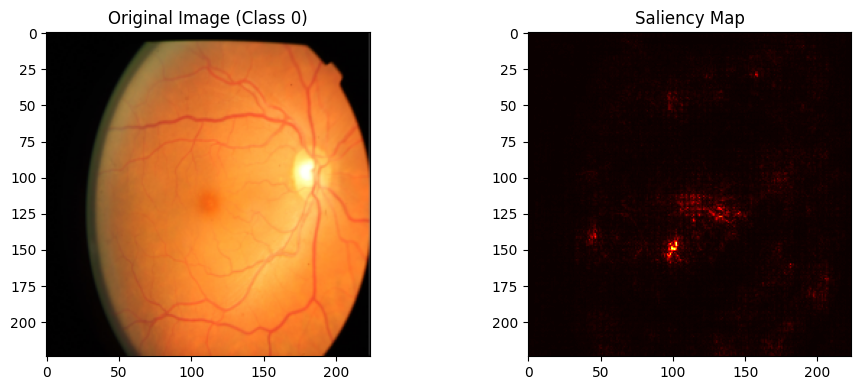

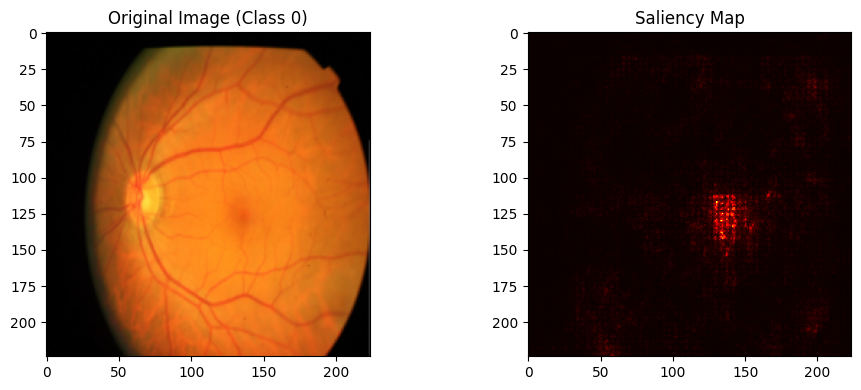

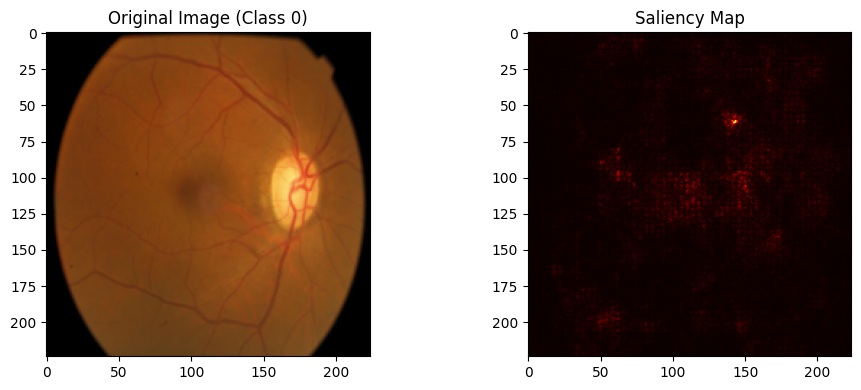

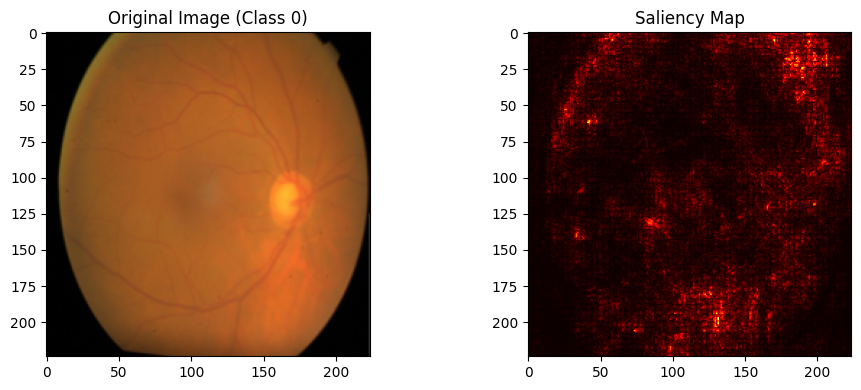

Class 1:


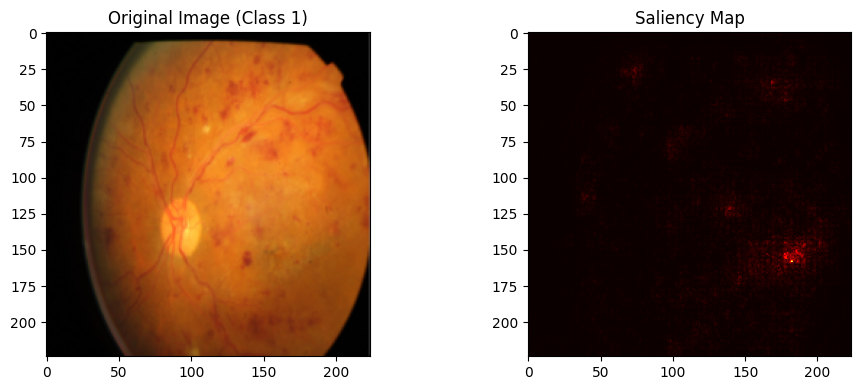

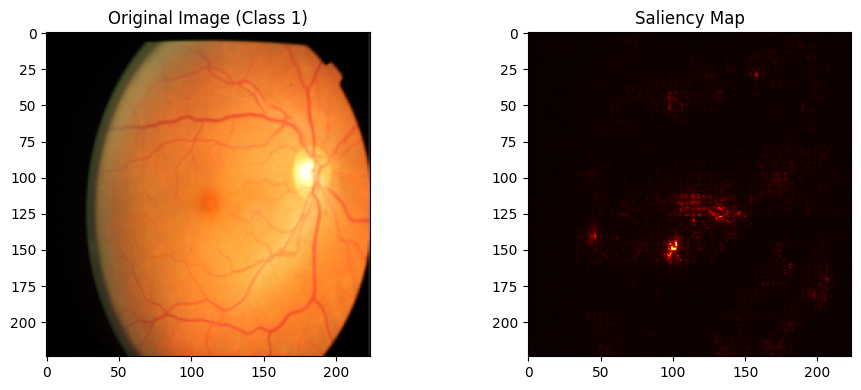

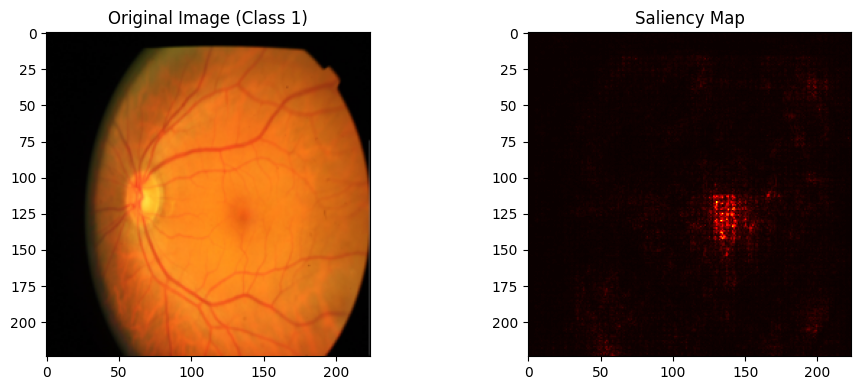

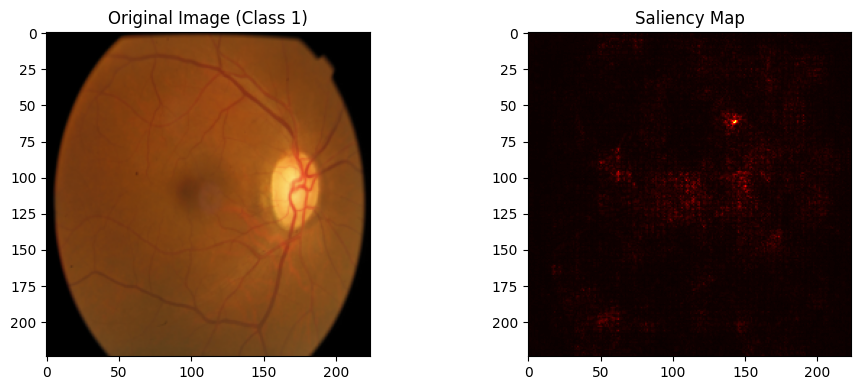

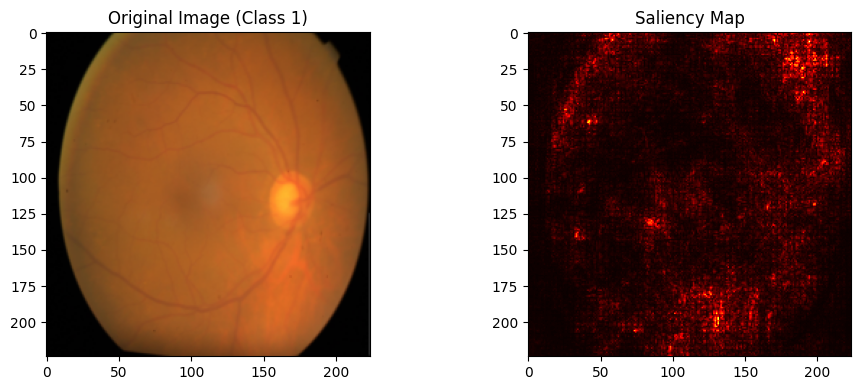

Class 2:


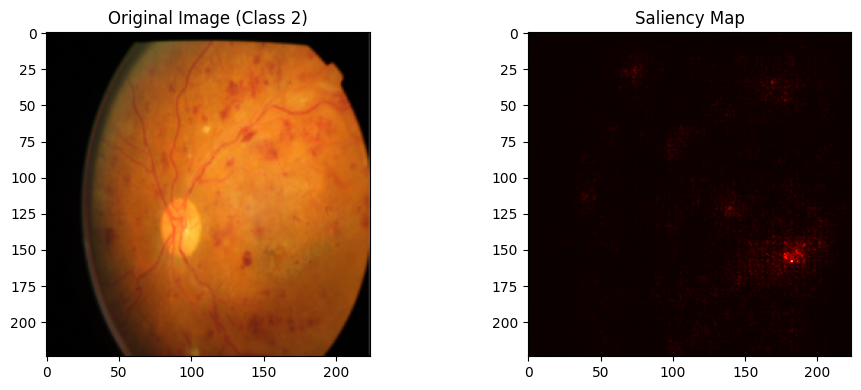

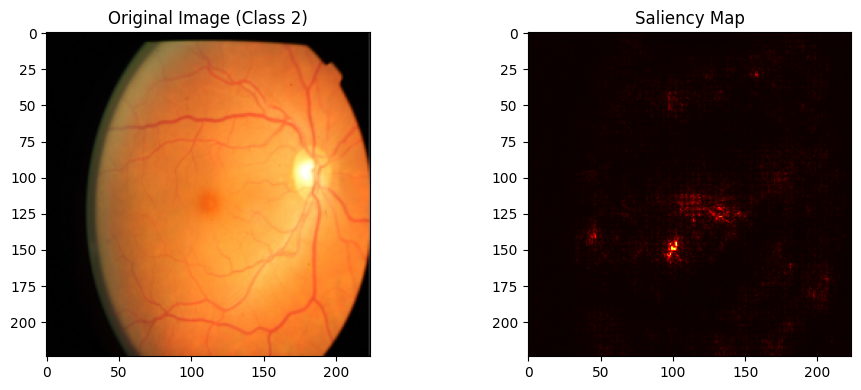

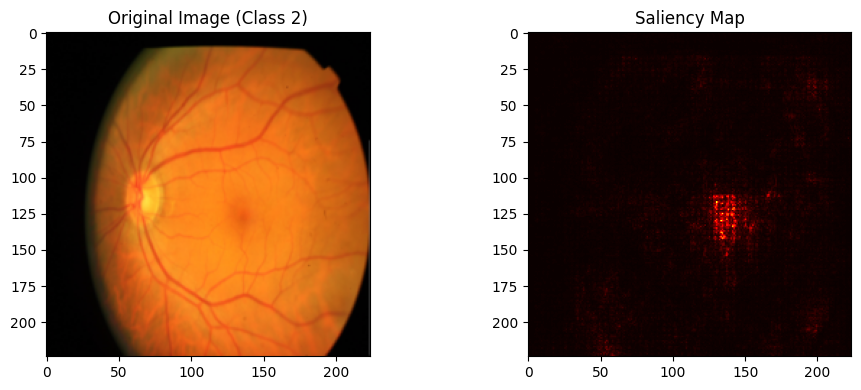

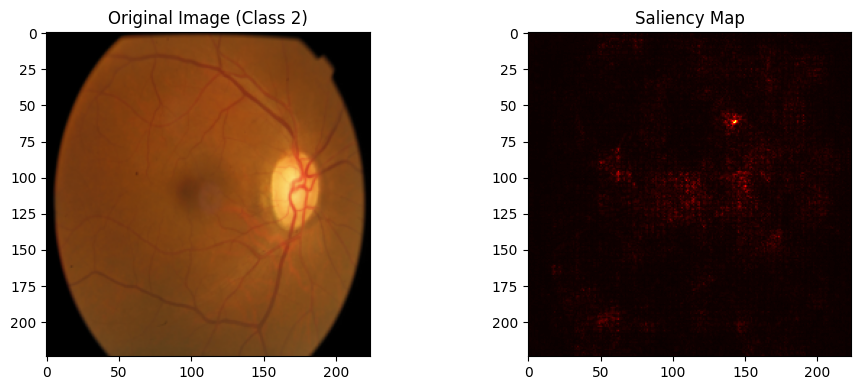

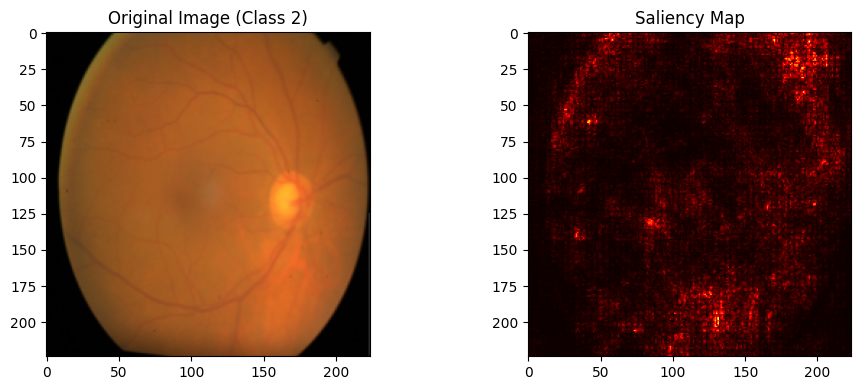

In [14]:
test(model, test_dataloader, saliency=True, device=device)

### Image quality assessment

In [15]:
# Good quality images
adequate_df = df_test[df_test['quality'] == 'Adequate']

# Bad quality images
inadequate_df = df_test[df_test['quality'] == 'Inadequate']

adequate_dataset = BRSETDataset(
    adequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

inadequate_dataset = BRSETDataset(
    inadequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

adequate_dataloader = DataLoader(adequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
inadequate_dataloader = DataLoader(inadequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

#### Adequate image quality

100%|██████████| 267/267 [01:14<00:00,  3.57it/s]


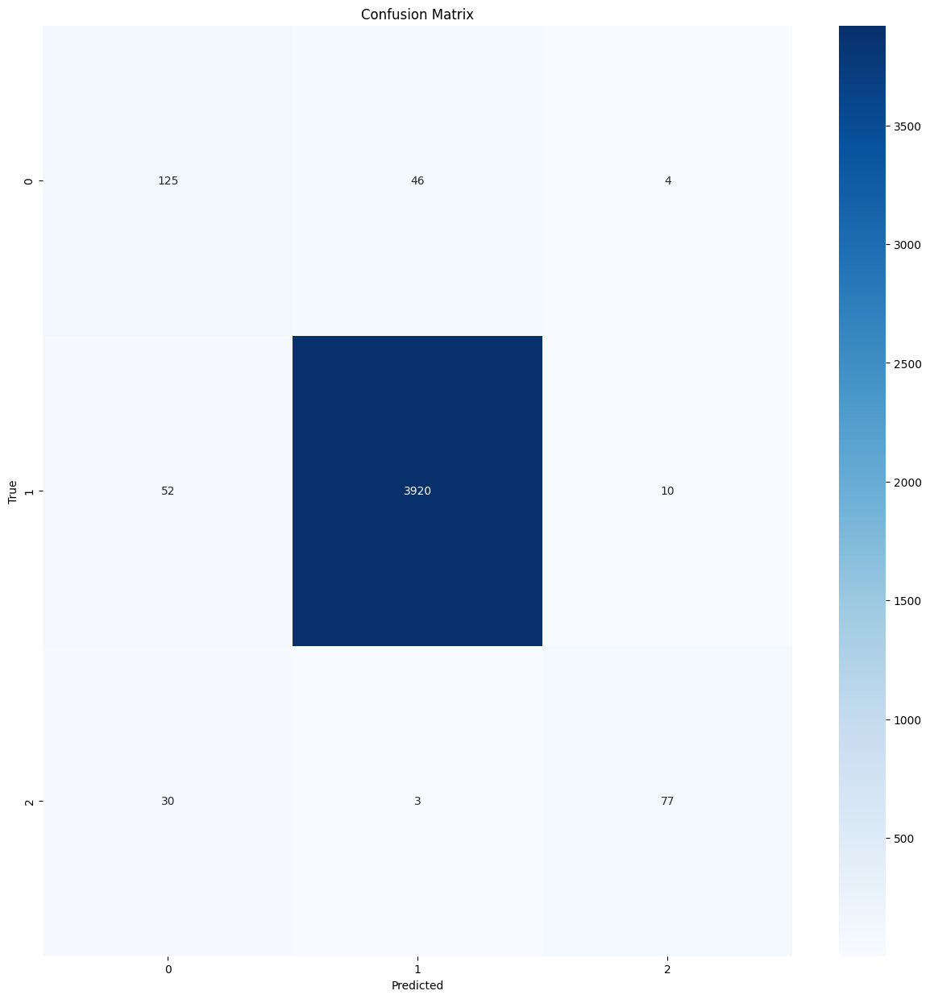

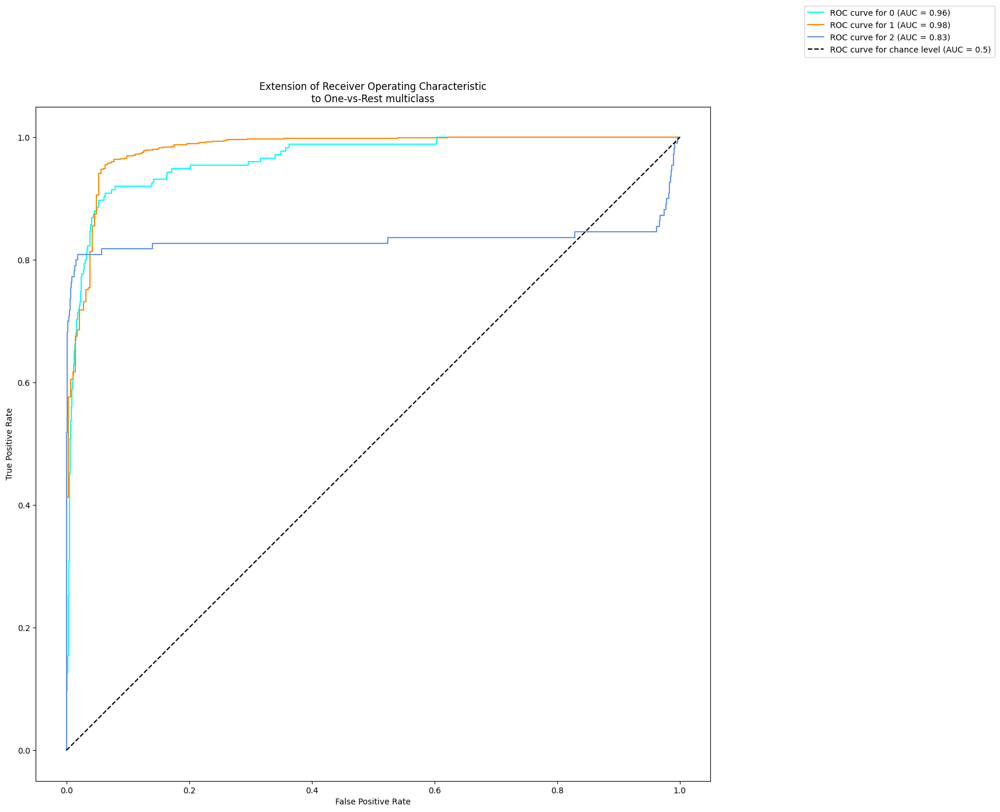

              precision    recall  f1-score   support

           0       0.60      0.71      0.65       175
           1       0.99      0.98      0.99      3982
           2       0.85      0.70      0.77       110

    accuracy                           0.97      4267
   macro avg       0.81      0.80      0.80      4267
weighted avg       0.97      0.97      0.97      4267

##################################################  Saliency Maps  ##################################################

Class 0:


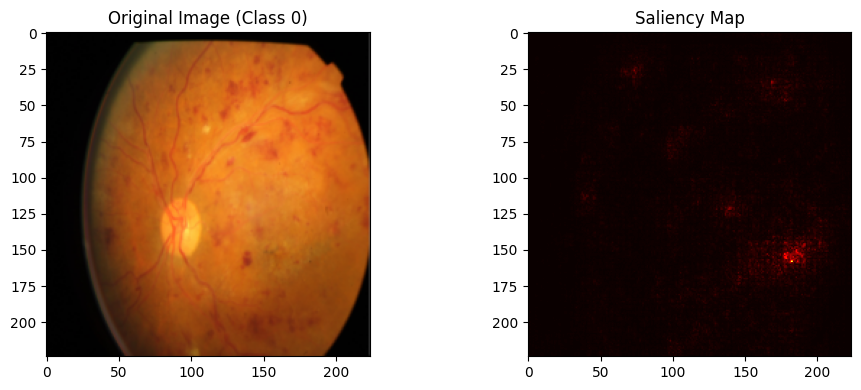

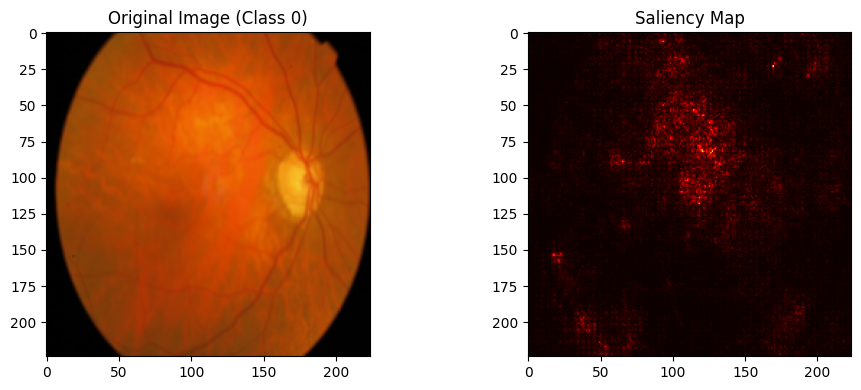

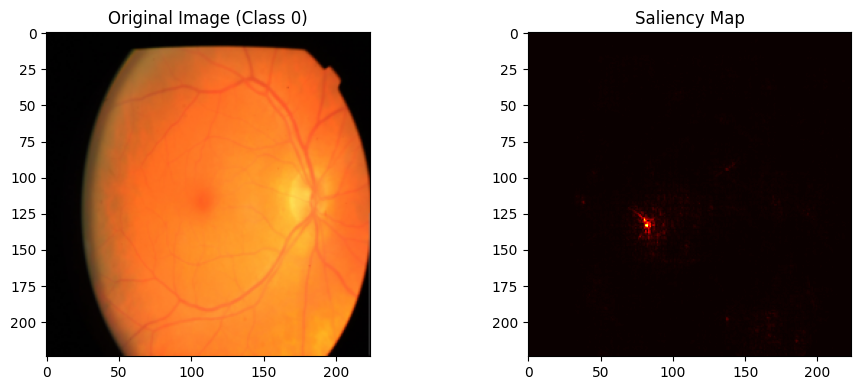

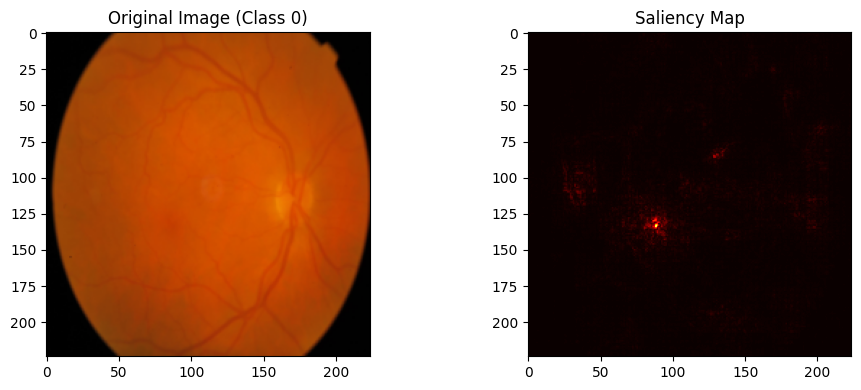

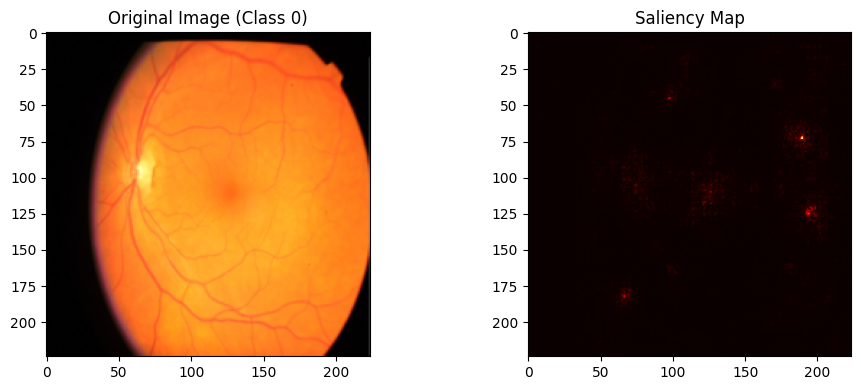

Class 1:


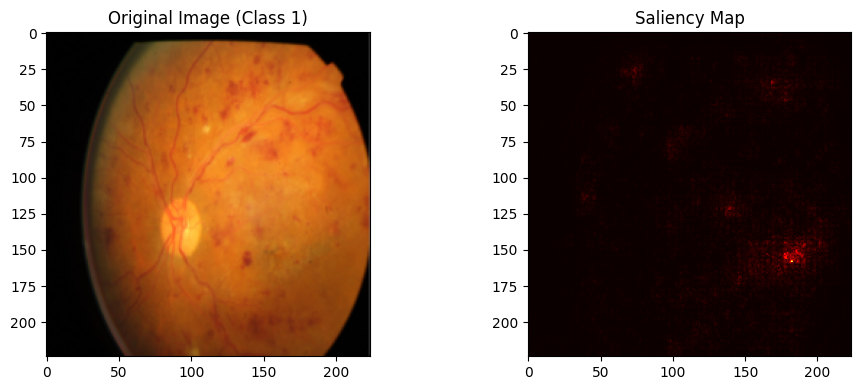

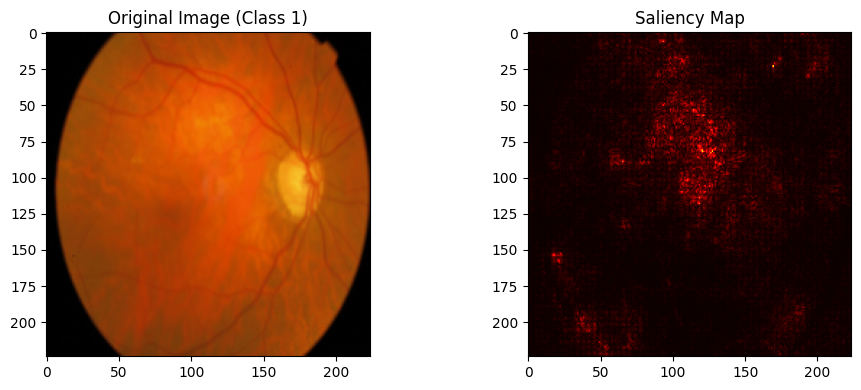

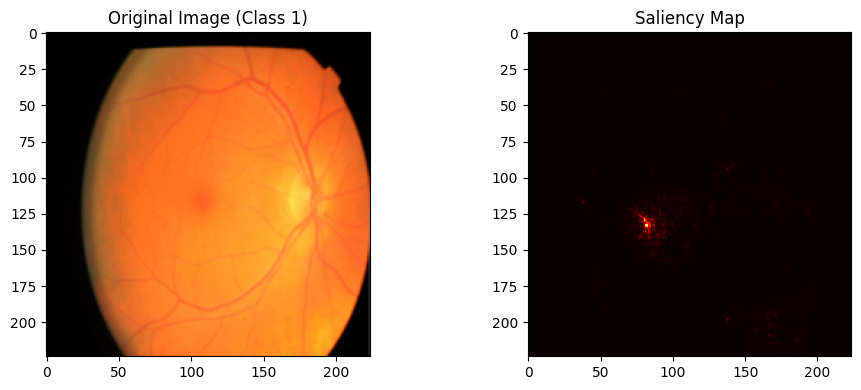

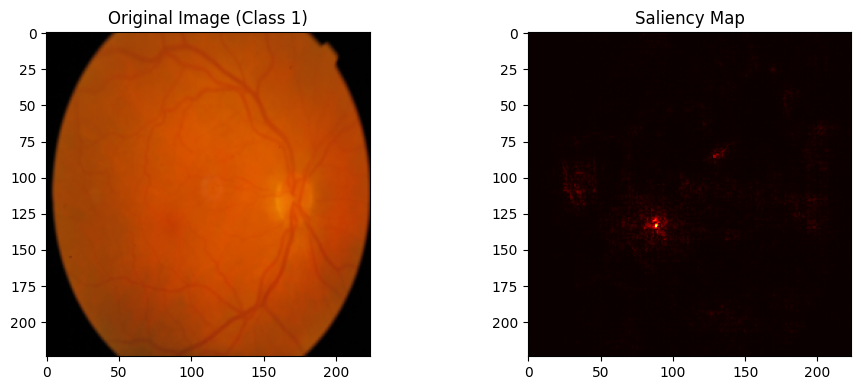

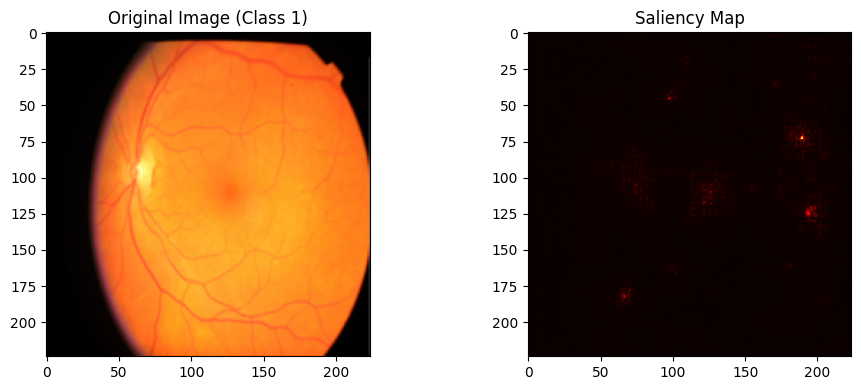

Class 2:


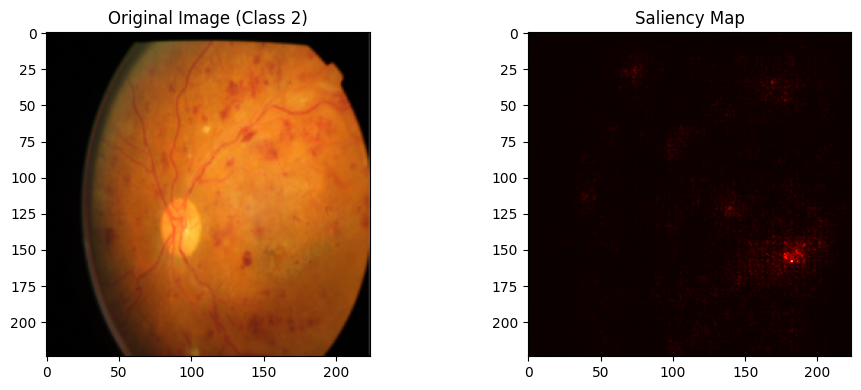

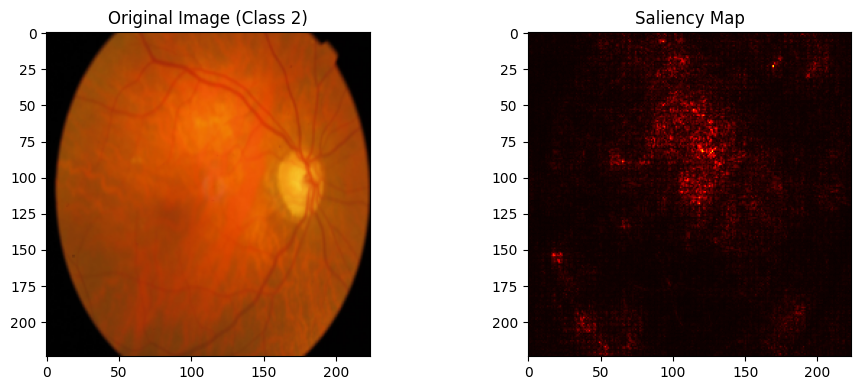

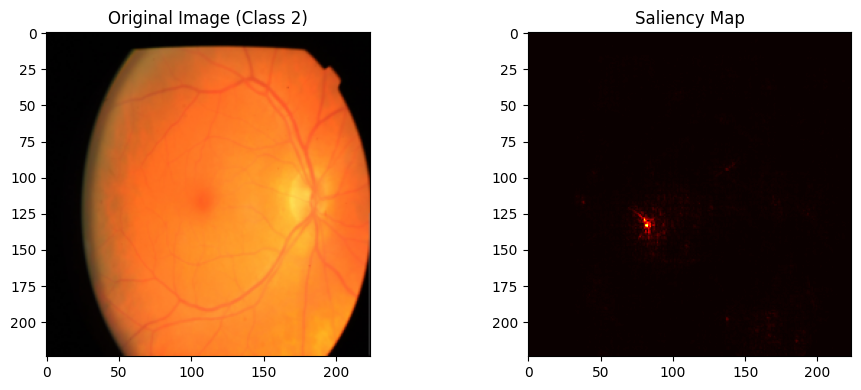

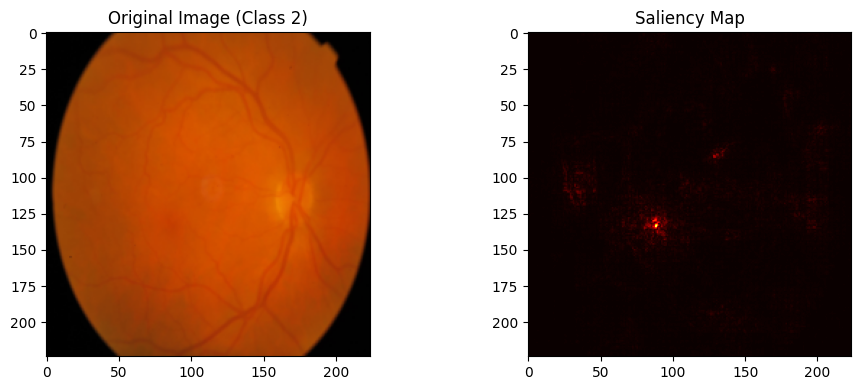

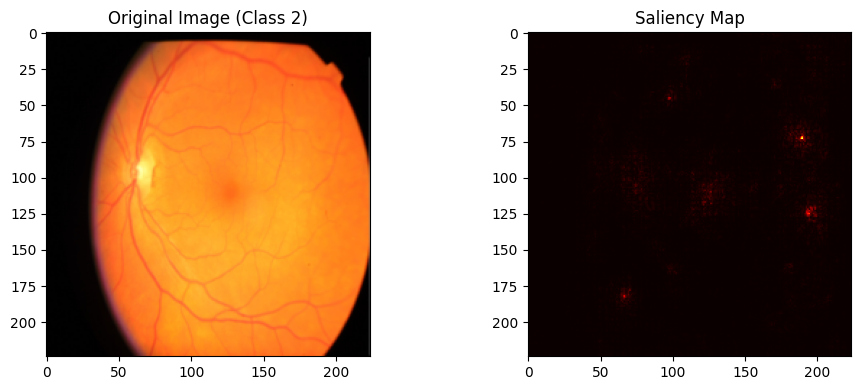

In [16]:
test(model, adequate_dataloader, saliency=True, device=device, save=True)

#### Inadequate image quality

100%|██████████| 39/39 [00:11<00:00,  3.26it/s]


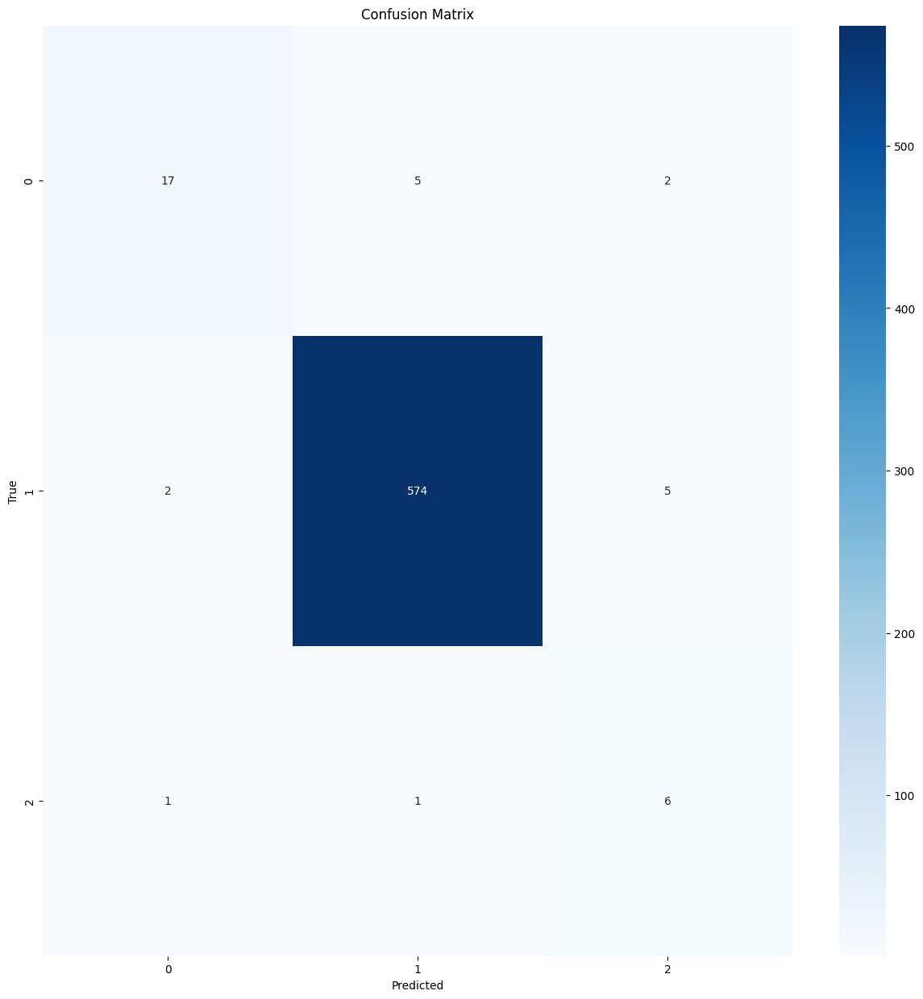

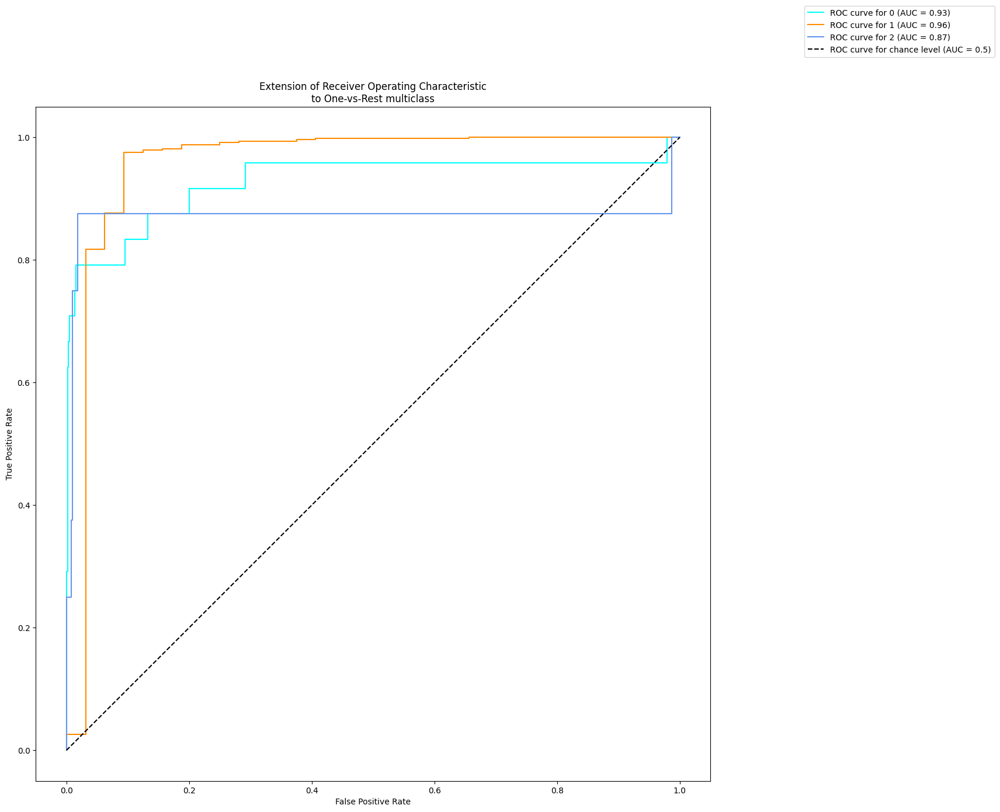

              precision    recall  f1-score   support

           0       0.85      0.71      0.77        24
           1       0.99      0.99      0.99       581
           2       0.46      0.75      0.57         8

    accuracy                           0.97       613
   macro avg       0.77      0.82      0.78       613
weighted avg       0.98      0.97      0.97       613

##################################################  Saliency Maps  ##################################################

Class 0:


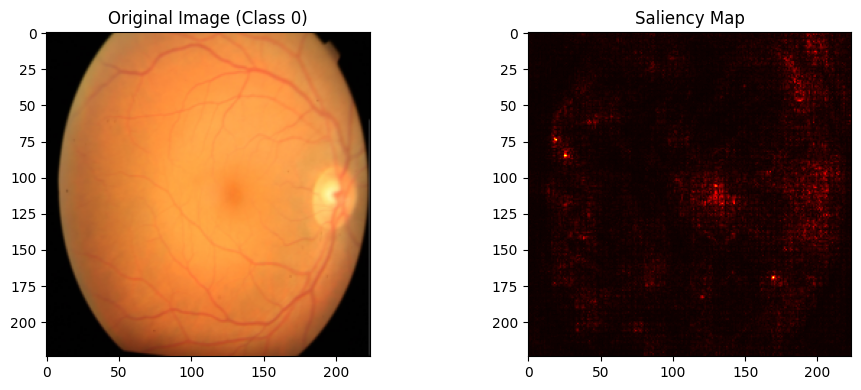

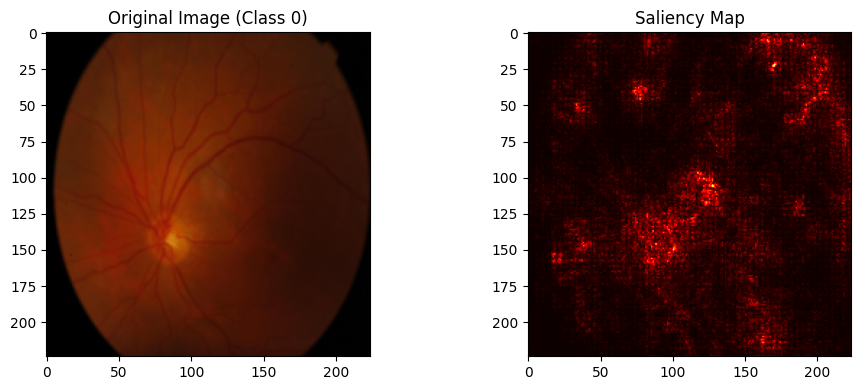

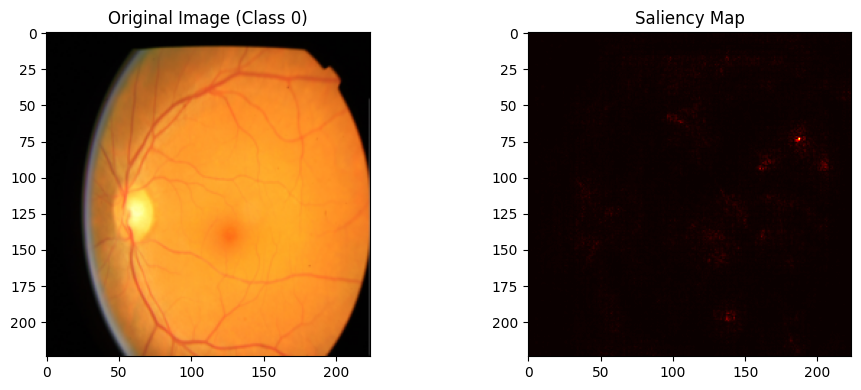

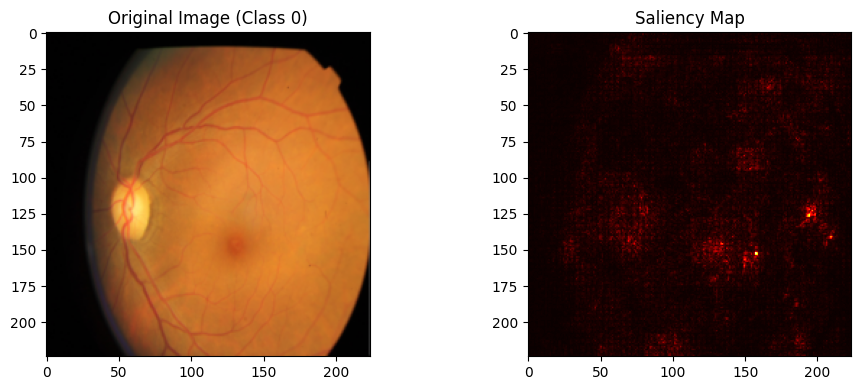

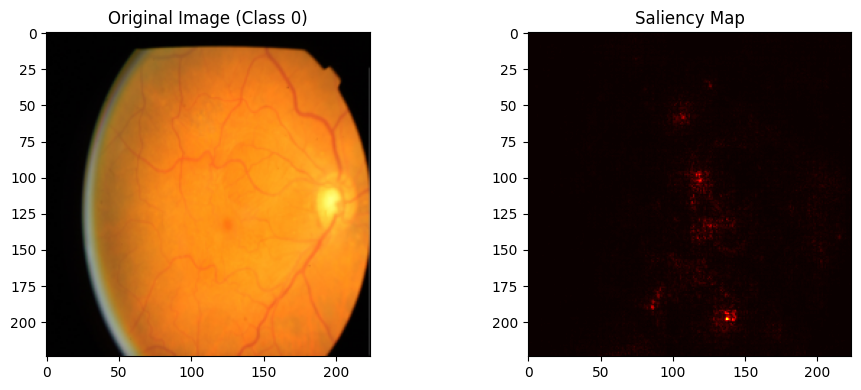

Class 1:


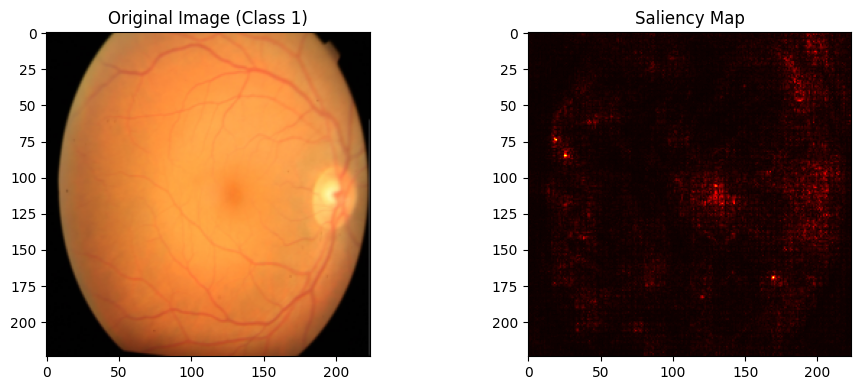

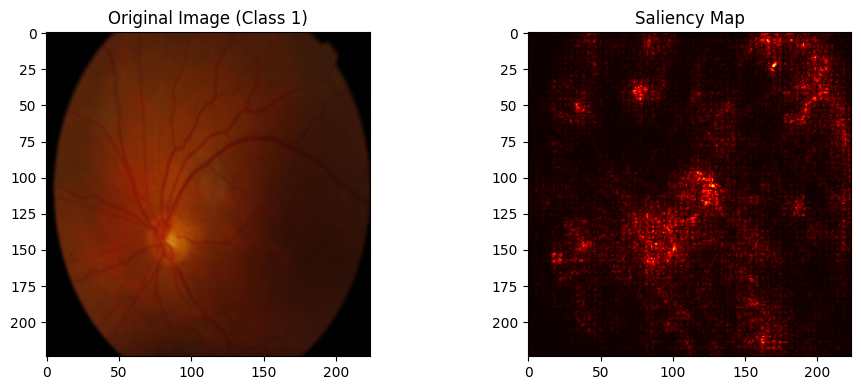

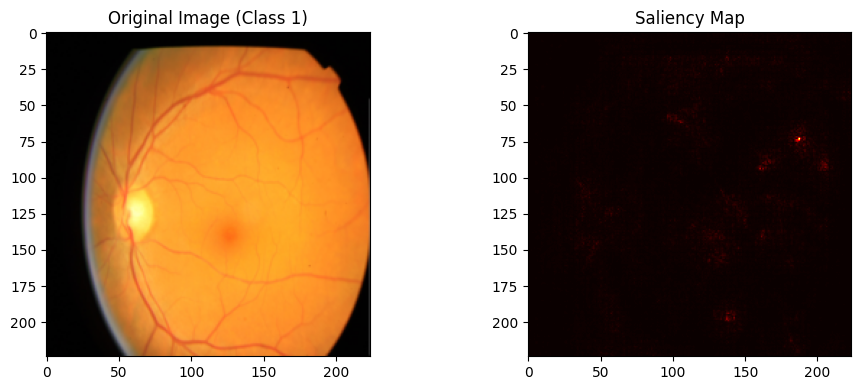

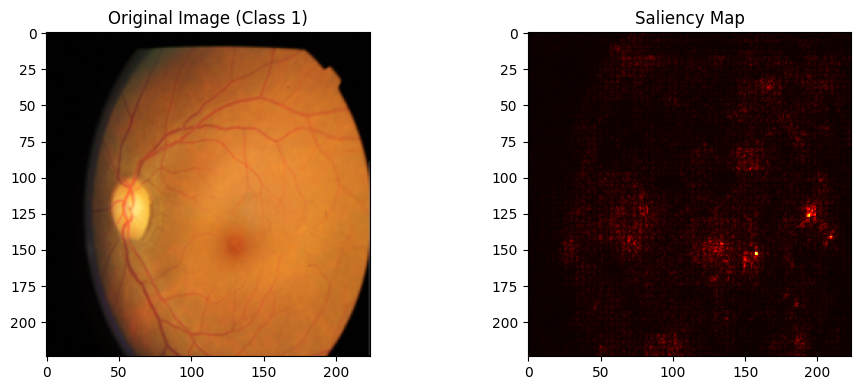

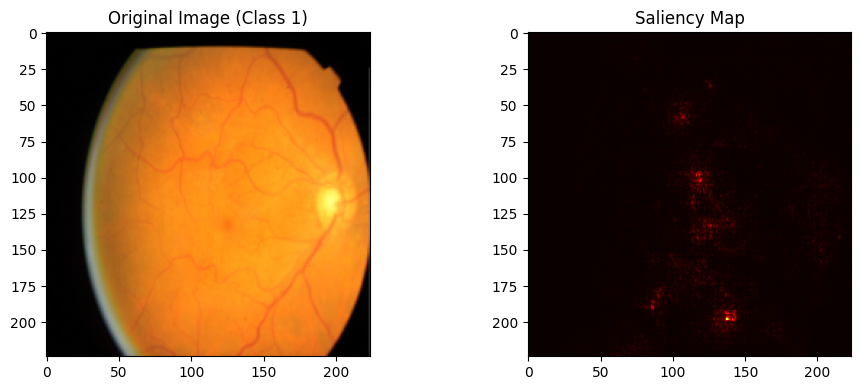

Class 2:


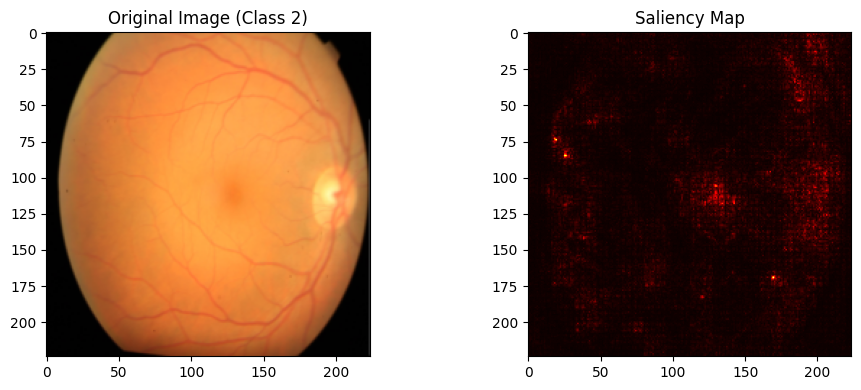

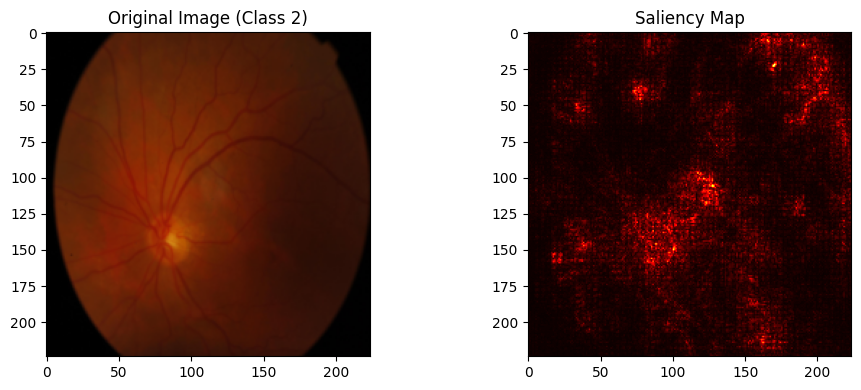

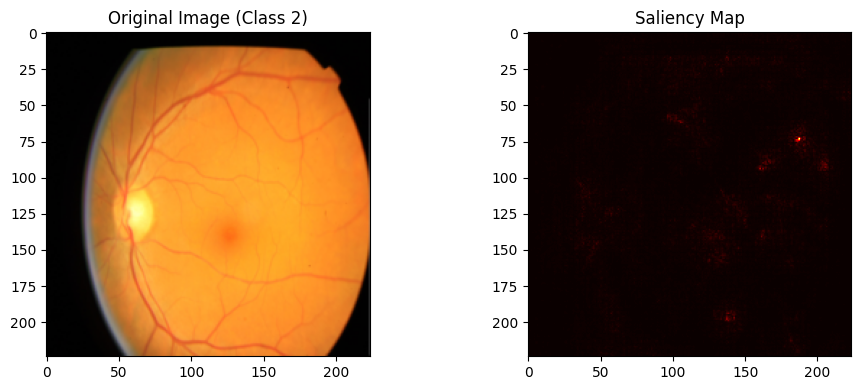

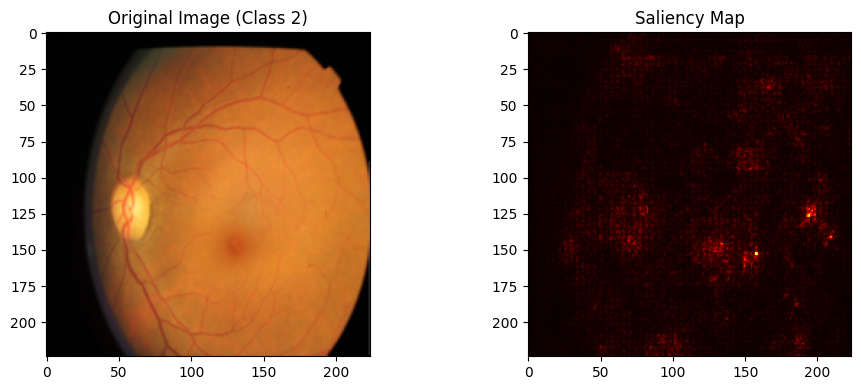

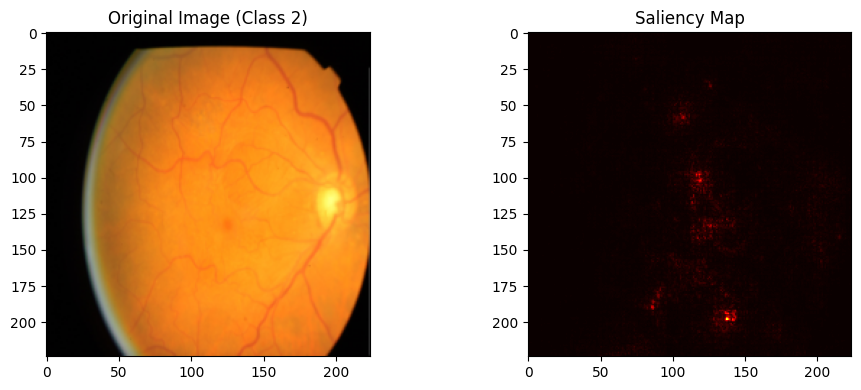

In [17]:
test(model, inadequate_dataloader, saliency=True, device=device)